# RoMa Drone Localization

## Overview

This notebook estimates a bottom-looking drone's **GPS position (latitude, longitude)** and **heading (yaw)** by matching extracted video frames against a georeferenced satellite image — using computer vision rather than relying solely on onboard GPS.

---

## Pipeline

```
Drone Video (.MP4)
       │
       ├── Step 2 — Frame Extraction
       │   ├── all frames @ 5 fps        →  used by Step 8a (LK optical flow)
       │   └── every 5th frame @ 1 fps   →  used by Steps 3–5 (RoMa)
       │
       ├── Step 1 — Satellite Reference Image
       │   Google Maps Static API · 1280×1280 px · zoom 18 · ~0.22 m/px
       │
       ├── Steps 3–5 — RoMa Dense Matching  (1 fps frames)
       │   DINOv2 backbone → 5 000 dense correspondences
       │   RANSAC homography → drone centre → GPS + Yaw per frame
       │
       ├── Step 8a — Lucas-Kanade Optical Flow  (5 fps frames)
       │   forward-backward consistency → pixel displacement per frame pair
       │
       ├── Step 8b — VO-GPS Fusion
       │   frames ≥ 500 RANSAC inliers → GPS anchors (absolute position)
       │   VO cumulative displacement → interpolation between anchors
       │   → full 1144-frame smooth trajectory
       │
       └── Step 9 — Accuracy Evaluation
           DJI SRT telemetry → lat / lon / yaw ground truth
           match by ms timestamp → position error (m) + yaw error (°)
```

---

## Key Components

| Component | Detail |
|---|---|
| **RoMa** | Robust dense feature matcher; DINOv2 semantic backbone handles the drone-to-satellite domain gap |
| **RANSAC Homography** | `cv2.findHomography` with 3 px threshold; inlier count used to judge match quality |
| **Web Mercator projection** | Converts satellite image pixels ↔ GPS coordinates; `pixel_to_gps` / `gps_to_px` are exact inverses |
| **Google Maps Static API** | `scale=2` returns 1280×1280 px covering the same geographic area as a 640×640 `scale=1` tile |
| **Lucas-Kanade optical flow** | `cv2.calcOpticalFlowPyrLK` with forward-backward consistency check; median displacement per frame pair |
| **VO-GPS fusion** | RoMa anchor frames give absolute position; VO provides smooth relative motion between anchors |
| **DJI SRT telemetry** | Subtitle file with per-frame `[latitude]`, `[longitude]`, `[rel_alt]`, `[gb_yaw]`; used as ground truth |

---

## Outputs

| File | Content |
|---|---|
| `results_roma/positions.json` | Per-frame RoMa localization results |
| `results_roma/fused_positions.json` | Full fused trajectory (anchor + VO-interpolated + extrapolated) |
| `results_roma/trajectory.png` | RoMa-only trajectory on satellite map |
| `results_roma/vo_fused_trajectory.png` | Side-by-side: RoMa-only vs fused trajectory |
| `results_roma/trajectory_vs_srt.png` | Estimated trajectory vs SRT ground truth |
| `results_roma/accuracy_roma.csv` | Per-frame position + yaw error (RoMa) |
| `results_roma/accuracy_fused.csv` | Per-frame position error (fused trajectory) |

> **Requirements**: GPU strongly recommended — Google Colab free T4 works well (Runtime → Change runtime type → GPU). On CPU each RoMa inference takes ~60 s.

In [1]:
%%capture
!pip install romatch requests Pillow tqdm python-dotenv

from google.colab import drive
drive.mount('/content/drive')

import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {device}')
if device.type == 'cuda':
    p = torch.cuda.get_device_properties(0)
    print(f'GPU : {p.name}  |  VRAM : {p.total_memory/1e9:.1f} GB')
else:
    print('WARNING: No GPU detected — RoMa will be very slow on CPU')

In [2]:
import gc, io, json, math, os, time
from pathlib import Path

import cv2
import numpy as np
import requests
import matplotlib.pyplot as plt
from PIL import Image
from tqdm.notebook import tqdm

## ⚙️ Configuration — change these before running

In [3]:
# ════════════════════════════════════════════════════════════════════════════
# 🔧 SETUP — edit this cell before running anything else
# ════════════════════════════════════════════════════════════════════════════
#
#  Files to upload to your Google Drive folder (DRIVE_ROOT below):
#
#   DRIVE_ROOT/
#   ├── IE_Challenge_lat43_521955_lon5_624290.MP4   ← drone video
#   └── gps_data.SRT                                ← DJI telemetry (Step 9)
#
#  API key: open the 🔑 Secrets panel in Colab left sidebar
#           add secret name  →  GOOGLE_MAPS_API_KEY
#           add secret value →  your Google Maps Static API key
#           (alternative: place a .env file in DRIVE_ROOT with the line
#            GOOGLE_MAPS_API_KEY=your_key_here)
#
# ════════════════════════════════════════════════════════════════════════════

from pathlib import Path

# ── 1. Google Drive project folder ────────────────────────────────────────────
DRIVE_ROOT = Path('/content/drive/MyDrive/capstone-dronomy')
#             └─ change this to match your Drive folder name

# ── 2. GPS centre  (latitude / longitude of the flight area) ──────────────────
CENTER_LAT =  43.521955
CENTER_LON =  -5.624290    # negative = West

# ── 3. Frame extraction ───────────────────────────────────────────────────────
VO_FPS    = 5    # frames per second extracted from the video (for optical flow)
ROMA_SKIP = 5    # run RoMa on every ROMA_SKIP-th VO frame → 1 fps for RoMa

# ── 4. Satellite tile (Google Maps Static API) ────────────────────────────────
ZOOM      = 18   # zoom 18 ≈ 0.22 m/px at this latitude — don't go below 17
SAT_SIZE  = 640  # API size parameter (pixels before scale)
SAT_SCALE = 2    # scale=2 → actual image 1280×1280 px, same area, double resolution

# ── 5. RoMa matching ──────────────────────────────────────────────────────────
NUM_MATCHES   = 5000  # dense match candidates sampled per frame
CERT_THRESH   = 0.05  # min RoMa certainty to keep a match (lower = more matches)
RANSAC_THRESH = 3.0   # RANSAC inlier pixel threshold
MIN_INLIERS   = 12    # min inliers to accept a localization result
EVERY_NTH     = 5     # batch: process every EVERY_NTH RoMa frame (speed vs coverage)

# ── 6. VO-GPS fusion ──────────────────────────────────────────────────────────
ANCHOR_MIN_INLIERS = 600  # only frames with ≥ this many inliers become GPS anchors
#                          raise if trajectory is still noisy; lower if too few anchors

# ── 7. Visualisation ─────────────────────────────────────────────────────────
FRAME_IDX = 50   # which frame to use for the single-frame demo (Step 4)
TOP_N     = 5    # how many top matches to display in Step 6

# ════════════════════════════════════════════════════════════════════════════
# Derived paths — no need to edit below this line
# ════════════════════════════════════════════════════════════════════════════
VIDEO_PATH  = DRIVE_ROOT / 'IE_Challenge_lat43_521955_lon5_624290.MP4'
FRAMES_DIR  = DRIVE_ROOT / f'frames_{VO_FPS}hz'
SRT_PATH    = DRIVE_ROOT / 'gps_data.SRT'
SAT_PATH    = Path('/content/satellite.png')
GEO_PATH    = Path('/content/satellite.json')
RESULTS_DIR = DRIVE_ROOT / 'results_roma'
RESULTS_DIR.mkdir(parents=True, exist_ok=True)

# ── API key ───────────────────────────────────────────────────────────────────
try:
    from google.colab import userdata
    MAPS_API_KEY = userdata.get('GOOGLE_MAPS_API_KEY')
    print('API key loaded from Colab Secrets.')
except Exception:
    from dotenv import dotenv_values
    _env = dotenv_values(str(DRIVE_ROOT / '.env'))
    MAPS_API_KEY = _env.get('GOOGLE_MAPS_API_KEY', '')
    print('API key loaded from .env file.')

assert MAPS_API_KEY, 'GOOGLE_MAPS_API_KEY not found — add it to Colab Secrets or .env'

print(f'\nDRIVE_ROOT : {DRIVE_ROOT}')
print(f'Video      : {VIDEO_PATH.name}')
print(f'SRT        : {SRT_PATH.name}')
print(f'Frames     : {FRAMES_DIR.name}  (VO={VO_FPS} fps, RoMa=1 fps)')
print(f'Satellite  : zoom={ZOOM}  scale={SAT_SCALE}  → {SAT_SIZE*SAT_SCALE}×{SAT_SIZE*SAT_SCALE} px  (~0.22 m/px)')
print(f'Results    : {RESULTS_DIR}')

API key loaded from Colab Secrets.

DRIVE_ROOT : /content/drive/MyDrive/capstone-dronomy
Video      : IE_Challenge_lat43_521955_lon5_624290.MP4
SRT        : gps_data.SRT
Frames     : frames_5hz  (VO=5 fps, RoMa=1 fps)
Satellite  : zoom=18  scale=2  → 1280×1280 px  (~0.22 m/px)
Results    : /content/drive/MyDrive/capstone-dronomy/results_roma


In [4]:
# ── Geo utilities (Web Mercator math) ─────────────────────────────────────

def _merc_xy(lat, lon, zoom):
    n = 2 ** zoom
    x = (lon + 180) / 360 * n * 256
    lr = math.radians(lat)
    y = (1 - math.log(math.tan(lr) + 1 / math.cos(lr)) / math.pi) / 2 * n * 256
    return x, y

def _merc_latlon(wx, wy, zoom):
    n = 2 ** zoom
    lon = wx / (n * 256) * 360 - 180
    lat = math.degrees(math.atan(math.sinh(math.pi * (1 - 2 * wy / (n * 256)))))
    return lat, lon

def fetch_satellite_google(lat, lon, zoom=18, size=640, scale=2, api_key='', save_path=None):
    """
    Fetch satellite image from Google Maps Static API.
    scale=2 returns a (size*scale)×(size*scale) image covering the same
    geographic area as size×size at scale=1, effectively doubling resolution.
    """
    url = (
        f'https://maps.googleapis.com/maps/api/staticmap'
        f'?center={lat},{lon}'
        f'&zoom={zoom}'
        f'&size={size}x{size}'
        f'&scale={scale}'
        f'&maptype=satellite'
        f'&key={api_key}'
    )
    r = requests.get(url, timeout=15)
    r.raise_for_status()

    img = Image.open(io.BytesIO(r.content)).convert('RGB')
    actual_px = size * scale   # e.g. 1280 for size=640, scale=2

    cx, cy = _merc_xy(lat, lon, zoom)
    half_geo = size / 2        # geographic extent in world-px (scale-independent)

    geo = {
        'center_lat': lat, 'center_lon': lon,
        'zoom': zoom,
        'img_size': actual_px,          # actual pixel dimensions
        'geo_size': size,               # geographic extent in world-px units
        'scale': scale,
        'top_left_x': cx - half_geo,
        'top_left_y': cy - half_geo,
        'meters_per_pixel': 156543.03 * math.cos(math.radians(lat)) / (2**zoom) / scale,
    }
    if save_path:
        img.save(str(save_path))
        with open(str(save_path).replace('.png', '.json'), 'w') as f:
            json.dump(geo, f, indent=2)
    return img, geo

def pixel_to_gps(px, py, geo):
    """Convert satellite image pixel (px, py) → (lat, lon).
    Handles both scale=1 (ESRI) and scale=2 (Google Maps) via geo['scale'].
    """
    s = geo.get('scale', 1)
    wx = geo['top_left_x'] + px / s
    wy = geo['top_left_y'] + py / s
    return _merc_latlon(wx, wy, geo['zoom'])

def gps_to_px(lat, lon, geo):
    """Convert GPS (lat, lon) → satellite image pixel (px, py).
    Exact inverse of pixel_to_gps: px = (wx - top_left_x) * scale.
    """
    s = geo.get('scale', 1)
    wx, wy = _merc_xy(lat, lon, geo['zoom'])
    return int((wx - geo['top_left_x']) * s), int((wy - geo['top_left_y']) * s)

def yaw_from_H(H):
    H = H / H[2, 2]
    a1 = math.atan2(H[1, 0], H[0, 0])
    a2 = math.atan2(-H[0, 1], H[1, 1])
    return math.degrees((a1 + a2) / 2)

print('Geo utilities ready.')

Geo utilities ready.


## Step 1 — Satellite Image

Fetching from Google Maps (zoom=18, size=640, scale=2)...
Image size : (1280, 1280)  (1280×1280 px)
Resolution : 0.217 m/pixel
Centre     : 43.521955°, -5.624290°


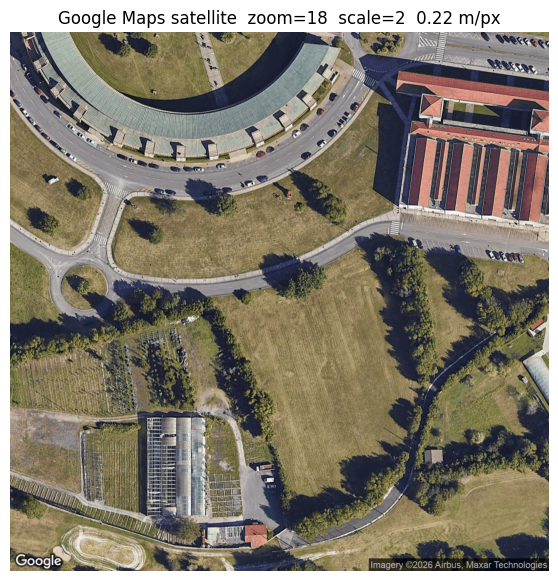

In [5]:
if SAT_PATH.exists() and GEO_PATH.exists():
    print('Loading cached satellite image...')
    sat_pil = Image.open(str(SAT_PATH)).convert('RGB')
    with open(str(GEO_PATH)) as f:
        geo = json.load(f)
else:
    print(f'Fetching from Google Maps (zoom={ZOOM}, size={SAT_SIZE}, scale={SAT_SCALE})...')
    sat_pil, geo = fetch_satellite_google(
        CENTER_LAT, CENTER_LON,
        zoom=ZOOM, size=SAT_SIZE, scale=SAT_SCALE,
        api_key=MAPS_API_KEY,
        save_path=SAT_PATH,
    )

print(f'Image size : {sat_pil.size}  ({sat_pil.size[0]}×{sat_pil.size[1]} px)')
print(f'Resolution : {geo["meters_per_pixel"]:.3f} m/pixel')
print(f'Centre     : {geo["center_lat"]:.6f}°, {geo["center_lon"]:.6f}°')

plt.figure(figsize=(7, 7))
plt.imshow(sat_pil)
plt.title(f'Google Maps satellite  zoom={ZOOM}  scale={geo.get("scale",1)}'
          f'  {geo["meters_per_pixel"]:.2f} m/px')
plt.axis('off')
plt.show()

## Step 2 — Extract Frames (1 fps)

In [6]:
existing = sorted(FRAMES_DIR.glob('*.jpg'))

if existing:
    frame_paths = existing
    print(f'Already extracted: {len(frame_paths)} frames in {FRAMES_DIR}')
else:
    assert VIDEO_PATH.exists(), f'Video not found: {VIDEO_PATH}'
    FRAMES_DIR.mkdir(parents=True, exist_ok=True)

    cap      = cv2.VideoCapture(str(VIDEO_PATH))
    src_fps  = cap.get(cv2.CAP_PROP_FPS)
    total    = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    interval = src_fps / VO_FPS   # e.g. 30/5 = save every 6th source frame
    next_sample, saved = 0.0, 0

    print(f'Video  : {src_fps:.1f} fps | {total/src_fps:.1f}s | {total} frames')
    print(f'Saving : every {interval:.0f} source frames → {VO_FPS} fps output')

    while True:
        ret, frame = cap.read()
        if not ret:
            break
        pos = cap.get(cv2.CAP_PROP_POS_FRAMES) - 1
        if pos >= next_sample:
            ts = int(cap.get(cv2.CAP_PROP_POS_MSEC))
            cv2.imwrite(str(FRAMES_DIR / f'frame_{ts:010d}ms.jpg'), frame,
                        [cv2.IMWRITE_JPEG_QUALITY, 95])
            saved += 1
            next_sample += interval
    cap.release()
    print(f'Done: {saved} frames saved to {FRAMES_DIR}')
    frame_paths = sorted(FRAMES_DIR.glob('*.jpg'))

# ── Two subsets ───────────────────────────────────────────────────────────
# frame_paths      : all frames at VO_FPS fps  → used by optical flow (Step 8)
# frame_paths_roma : every ROMA_SKIP-th frame  → 1 fps equivalent for RoMa (Step 5)
frame_paths_roma = frame_paths[::ROMA_SKIP]

print(f'\nVO frames   : {len(frame_paths)} @ {VO_FPS} fps  (index 0–{len(frame_paths)-1})')
print(f'RoMa frames : {len(frame_paths_roma)} @ {VO_FPS//ROMA_SKIP} fps')

Already extracted: 1144 frames in /content/drive/MyDrive/capstone-dronomy/frames_5hz

VO frames   : 1144 @ 5 fps  (index 0–1143)
RoMa frames : 229 @ 1 fps


## Step 3 — Load RoMa Model

In [7]:
# Fix: local_corr is a compiled CUDA extension not shipped in the PyPI package.
# We implement local_corr.local_corr() in pure PyTorch so RoMa can run on Colab.
import sys, types
import torch.nn.functional as F

def _local_corr_fn(feat0, feat1, warp,
                   mode='bilinear', padding_mode='zeros', **kwargs):
    """
    Pure-PyTorch replacement for the C++ local_corr.local_corr().

    feat0        : (B, hw, c)     normalized query features
    feat1        : (B, h, w, c)   dense feature map
    warp         : (B, hw, K, 2)  K sampling coords per query, in [-1, 1]
    mode         : grid_sample interpolation mode (forwarded from RoMa)
    padding_mode : grid_sample padding mode
    returns      : (B, hw, K)     local correlation scores
    """
    B, hw, c = feat0.shape
    K = warp.shape[2]

    feat1_bchw = feat1.permute(0, 3, 1, 2).contiguous()  # (B, c, h, w)
    grid = warp.reshape(B, hw * K, 1, 2)                  # (B, hw*K, 1, 2)

    sampled = F.grid_sample(feat1_bchw, grid,
                             mode=mode,
                             padding_mode=padding_mode,
                             align_corners=False)          # (B, c, hw*K, 1)
    sampled = sampled.squeeze(-1).reshape(B, c, hw, K)    # (B, c, hw, K)

    feat0_t = feat0.permute(0, 2, 1).unsqueeze(-1)        # (B, c, hw, 1)
    corr = (feat0_t * sampled).sum(dim=1)                 # (B, hw, K)
    return corr

_lc = types.ModuleType('local_corr')
_lc.local_corr = _local_corr_fn
sys.modules['local_corr'] = _lc
print('local_corr.local_corr registered — pure PyTorch fallback active')

local_corr.local_corr registered — pure PyTorch fallback active


In [8]:
from romatch import roma_outdoor

print('Loading RoMa (outdoor weights, DINOv2 backbone)...')
roma_model = roma_outdoor(device=device)
print('Model ready.')

# GPU memory after loading
if device.type == 'cuda':
    used = torch.cuda.memory_allocated() / 1e9
    total_vram = torch.cuda.get_device_properties(0).total_memory / 1e9
    print(f'VRAM used: {used:.1f} / {total_vram:.1f} GB')

Loading RoMa (outdoor weights, DINOv2 backbone)...
Downloading: "https://github.com/Parskatt/storage/releases/download/roma/roma_outdoor.pth" to /root/.cache/torch/hub/checkpoints/roma_outdoor.pth


100%|██████████| 425M/425M [00:03<00:00, 118MB/s]


Downloading: "https://dl.fbaipublicfiles.com/dinov2/dinov2_vitl14/dinov2_vitl14_pretrain.pth" to /root/.cache/torch/hub/checkpoints/dinov2_vitl14_pretrain.pth


100%|██████████| 1.13G/1.13G [00:06<00:00, 191MB/s]
2026-06-25 07:40:29.600 | INFO     | romatch.models.model_zoo.roma_models:roma_model:61 - Using coarse resolution (560, 560), and upsample res (864, 864)


Model ready.
VRAM used: 0.5 / 15.6 GB


In [9]:
# ── Core localization function ─────────────────────────────────────────────

def localize_frame_roma(drone_bgr, sat_pil, geo, model, device,
                         num_matches=NUM_MATCHES,
                         cert_thresh=CERT_THRESH,
                         ransac_thresh=RANSAC_THRESH,
                         min_inliers=MIN_INLIERS):
    """
    Localize one drone frame against a georeferenced satellite image using RoMa.
    Returns dict with lat/lon/yaw_deg/inliers/... or None if failed.
    """
    # Convert drone BGR → PIL RGB, resize to 640×480 (reduces scale mismatch)
    drone_pil = Image.fromarray(cv2.cvtColor(drone_bgr, cv2.COLOR_BGR2RGB))
    drone_pil = drone_pil.resize((640, 480), Image.BILINEAR)
    W_d, H_d  = drone_pil.size   # 640, 480
    W_s, H_s  = sat_pil.size

    # Dense matching
    with torch.no_grad():
        warp, certainty = model.match(drone_pil, sat_pil, device=device)

    # Sample correspondences
    matches, cert_vals = model.sample(warp, certainty, num=num_matches)
    cert_np = cert_vals.cpu().numpy()

    # Convert normalized [-1,1] coords → pixel coords
    if hasattr(model, 'to_pixel_coordinates'):
        kpts_d, kpts_s = model.to_pixel_coordinates(matches, H_d, W_d, H_s, W_s)
        kpts_d = kpts_d.cpu().numpy()
        kpts_s = kpts_s.cpu().numpy()
    else:
        kpts_d = ((matches[:, :2] + 1) / 2 * torch.tensor(
            [[W_d, H_d]], dtype=torch.float32, device=matches.device)).cpu().numpy()
        kpts_s = ((matches[:, 2:] + 1) / 2 * torch.tensor(
            [[W_s, H_s]], dtype=torch.float32, device=matches.device)).cpu().numpy()

    # Certainty filter
    keep = cert_np > cert_thresh
    if keep.sum() < 4:
        return None
    kpts_d, kpts_s = kpts_d[keep], kpts_s[keep]
    cert_kept = cert_np[keep]

    # RANSAC homography
    H, mask = cv2.findHomography(kpts_d, kpts_s, cv2.RANSAC, ransac_thresh)
    if H is None:
        return None
    mask = mask.ravel().astype(bool)
    n_in = int(mask.sum())
    if n_in < min_inliers:
        return None

    # GPS from drone image center
    c_sat = cv2.perspectiveTransform(
        np.float32([[[W_d / 2, H_d / 2]]]), H)[0, 0]
    lat, lon = pixel_to_gps(float(c_sat[0]), float(c_sat[1]), geo)

    # Sanity check: must be within 2 km of nominal
    dlat = abs(lat - CENTER_LAT) * 111000
    dlon = abs(lon - CENTER_LON) * 111000 * math.cos(math.radians(CENTER_LAT))
    dist_m = math.sqrt(dlat**2 + dlon**2)
    if dist_m > 2000:
        return None

    return {
        'lat': lat, 'lon': lon,
        'yaw_deg': yaw_from_H(H),
        'inliers': n_in,
        'inlier_ratio': n_in / len(kpts_d),
        'dist_nominal_m': dist_m,
        'H': H, 'kpts_d': kpts_d, 'kpts_s': kpts_s,
        'cert': cert_kept, 'mask': mask,
    }

print('localize_frame_roma() defined.')

localize_frame_roma() defined.


## Step 4 — Single Frame Demo

In [10]:
drone_bgr = cv2.imread(str(frame_paths[FRAME_IDX]))
drone_rgb = cv2.cvtColor(drone_bgr, cv2.COLOR_BGR2RGB)

print(f'Frame [{FRAME_IDX}]: {frame_paths[FRAME_IDX].name}')
print(f'Running RoMa...')
t0 = time.time()
result = localize_frame_roma(drone_bgr, sat_pil, geo, roma_model, device)
dt = time.time() - t0
print(f'Done in {dt:.1f}s')

if result is None:
    print('Localization FAILED — try a different FRAME_IDX in the config cell')
else:
    print(f'\nInliers        : {result["inliers"]} / {len(result["kpts_d"])}  ({result["inlier_ratio"]:.0%})')
    print(f'Latitude       : {result["lat"]:.6f}°')
    print(f'Longitude      : {result["lon"]:.6f}°')
    print(f'Yaw            : {result["yaw_deg"]:.1f}°')
    print(f'Dist nominal   : {result["dist_nominal_m"]:.0f} m')

Frame [50]: frame_0000010010ms.jpg
Running RoMa...
Done in 8.9s

Inliers        : 648 / 4567  (14%)
Latitude       : 43.521290°
Longitude      : -5.623855°
Yaw            : 6.1°
Dist nominal   : 82 m


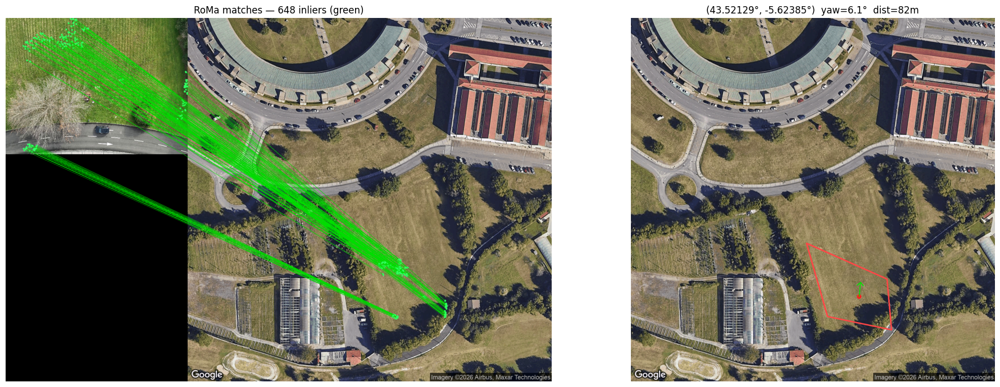

In [11]:
# Visualize matches + localization result
if result is not None:
    kpts_d = result['kpts_d']
    kpts_s = result['kpts_s']
    mask   = result['mask']
    H      = result['H']

    # — Match lines —
    drone_vis = cv2.resize(drone_bgr, (640, 480))
    drone_vis = cv2.cvtColor(drone_vis, cv2.COLOR_BGR2RGB)
    sat_vis_arr = np.array(sat_pil)
    h0, w0 = drone_vis.shape[:2]
    h1, w1 = sat_vis_arr.shape[:2]
    canvas = np.zeros((max(h0, h1), w0 + w1, 3), dtype=np.uint8)
    canvas[:h0, :w0] = drone_vis
    canvas[:h1, w0:] = sat_vis_arr

    rng = np.random.default_rng(42)
    idx = rng.choice(mask.sum(), size=min(200, mask.sum()), replace=False)
    for i in idx:
        p0 = (int(kpts_d[mask][i, 0]), int(kpts_d[mask][i, 1]))
        p1 = (int(kpts_s[mask][i, 0]) + w0, int(kpts_s[mask][i, 1]))
        cv2.line(canvas, p0, p1, (0, 220, 0), 1)
        cv2.circle(canvas, p0, 3, (50, 255, 100), -1)
        cv2.circle(canvas, p1, 3, (50, 255, 100), -1)

    # — Satellite with footprint —
    sat_loc = sat_vis_arr.copy()
    corners = np.float32([[0,0],[640,0],[640,480],[0,480]]).reshape(-1,1,2)
    proj    = np.int32(cv2.perspectiveTransform(corners, H))
    cv2.polylines(sat_loc, [proj], True, (255, 70, 70), 3)
    cx = int(cv2.perspectiveTransform(np.float32([[[320, 240]]]), H)[0,0,0])
    cy = int(cv2.perspectiveTransform(np.float32([[[320, 240]]]), H)[0,0,1])
    cv2.circle(sat_loc, (cx, cy), 8, (255, 30, 30), -1)
    yr = math.radians(result['yaw_deg'])
    cv2.arrowedLine(sat_loc, (cx, cy),
        (int(cx + 50*math.sin(yr)), int(cy - 50*math.cos(yr))),
        (0, 230, 0), 2, tipLength=0.3)

    fig, axes = plt.subplots(1, 2, figsize=(20, 7))
    axes[0].imshow(canvas)
    axes[0].set_title(f'RoMa matches — {result["inliers"]} inliers (green)')
    axes[0].axis('off')
    axes[1].imshow(sat_loc)
    axes[1].set_title(
        f'({result["lat"]:.5f}°, {result["lon"]:.5f}°)  '
        f'yaw={result["yaw_deg"]:.1f}°  '
        f'dist={result["dist_nominal_m"]:.0f}m')
    axes[1].axis('off')
    plt.tight_layout()
    plt.savefig(str(RESULTS_DIR / f'roma_frame{FRAME_IDX}.png'), dpi=120, bbox_inches='tight')
    plt.show()

## Step 5 — Batch Processing

In [12]:
subset = frame_paths_roma[::EVERY_NTH]
print(f'Processing {len(subset)} / {len(frame_paths_roma)} RoMa frames '
      f'(every {EVERY_NTH}th @ 1 fps, min_inliers={MIN_INLIERS})...')

all_results = []

for i, fp in enumerate(tqdm(subset)):
    frame = cv2.imread(str(fp))
    res   = localize_frame_roma(frame, sat_pil, geo, roma_model, device)

    entry = {'idx': i, 'frame': fp.name, 'success': res is not None}
    if res:
        entry.update({
            'lat':            res['lat'],
            'lon':            res['lon'],
            'yaw_deg':        res['yaw_deg'],
            'inliers':        res['inliers'],
            'inlier_ratio':   res['inlier_ratio'],
            'dist_nominal_m': res['dist_nominal_m'],
        })
    all_results.append(entry)

    del frame, res
    gc.collect()
    if device.type == 'cuda':
        torch.cuda.empty_cache()

n_ok = sum(r['success'] for r in all_results)
print(f'\nLocalized: {n_ok} / {len(all_results)} frames ({n_ok/len(all_results):.0%})')

with open(str(RESULTS_DIR / 'positions.json'), 'w') as f:
    json.dump(all_results, f, indent=2)
print(f'Saved → {RESULTS_DIR}/positions.json')

Processing 46 / 229 RoMa frames (every 5th @ 1 fps, min_inliers=12)...


  0%|          | 0/46 [00:00<?, ?it/s]


Localized: 44 / 46 frames (96%)
Saved → /content/drive/MyDrive/capstone-dronomy/results_roma/positions.json


## Step 6 — Top Matches

In [13]:
good = sorted([r for r in all_results if r['success']],
               key=lambda r: r['inliers'], reverse=True)[:TOP_N]

if not good:
    print('No successful localizations. Try lowering MIN_INLIERS or CERT_THRESH.')
else:
    print(f'Top {len(good)} frames by inlier count:')
    for r in good:
        print(f"  [{r['idx']:3d}] {r['frame']}  "
              f"{r['inliers']} inliers ({r['inlier_ratio']:.0%})  "
              f"({r['lat']:.5f}°, {r['lon']:.5f}°)  "
              f"dist={r['dist_nominal_m']:.0f}m  yaw={r['yaw_deg']:.1f}°")

    fig, axes = plt.subplots(len(good), 2, figsize=(18, len(good) * 4))
    if len(good) == 1:
        axes = [axes]

    for row, r in enumerate(good):
        frame_bgr = cv2.imread(str(FRAMES_DIR / r['frame']))
        res = localize_frame_roma(frame_bgr, sat_pil, geo, roma_model, device)

        drone_small = cv2.resize(frame_bgr, (640, 480))
        drone_rgb_s = cv2.cvtColor(drone_small, cv2.COLOR_BGR2RGB)
        sat_arr = np.array(sat_pil)

        h0, w0 = drone_rgb_s.shape[:2]
        h1, w1 = sat_arr.shape[:2]
        canvas = np.zeros((max(h0,h1), w0+w1, 3), np.uint8)
        canvas[:h0, :w0] = drone_rgb_s
        canvas[:h1, w0:] = sat_arr

        sat_vis = sat_arr.copy()
        if res:
            rng = np.random.default_rng(0)
            n_draw = min(150, res['mask'].sum())
            idx_ = rng.choice(res['mask'].sum(), n_draw, replace=False)
            for ii in idx_:
                p0 = (int(res['kpts_d'][res['mask']][ii,0]),
                      int(res['kpts_d'][res['mask']][ii,1]))
                p1 = (int(res['kpts_s'][res['mask']][ii,0])+w0,
                      int(res['kpts_s'][res['mask']][ii,1]))
                cv2.line(canvas, p0, p1, (0,220,0), 1)
            corners = np.float32([[0,0],[640,0],[640,480],[0,480]]).reshape(-1,1,2)
            proj = np.int32(cv2.perspectiveTransform(corners, res['H']))
            cv2.polylines(sat_vis, [proj], True, (255,70,70), 3)
            cs = cv2.perspectiveTransform(np.float32([[[320,240]]]), res['H'])[0,0]
            cv2.circle(sat_vis, (int(cs[0]),int(cs[1])), 8, (255,30,30), -1)

        axes[row][0].imshow(canvas)
        axes[row][0].set_title(f"Frame [{r['idx']}] — {r['inliers']} inliers")
        axes[row][0].axis('off')
        axes[row][1].imshow(sat_vis)
        axes[row][1].set_title(
            f"({r['lat']:.5f}°, {r['lon']:.5f}°)  "
            f"yaw={r['yaw_deg']:.1f}°  dist={r['dist_nominal_m']:.0f}m")
        axes[row][1].axis('off')
        del frame_bgr, res
        gc.collect()

    plt.suptitle(f'Top {TOP_N} frames by RoMa inlier count', fontsize=13, y=1.01)
    plt.tight_layout()
    plt.savefig(str(RESULTS_DIR / 'top_matches.png'), dpi=100, bbox_inches='tight')
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

## Step 7 — Trajectory

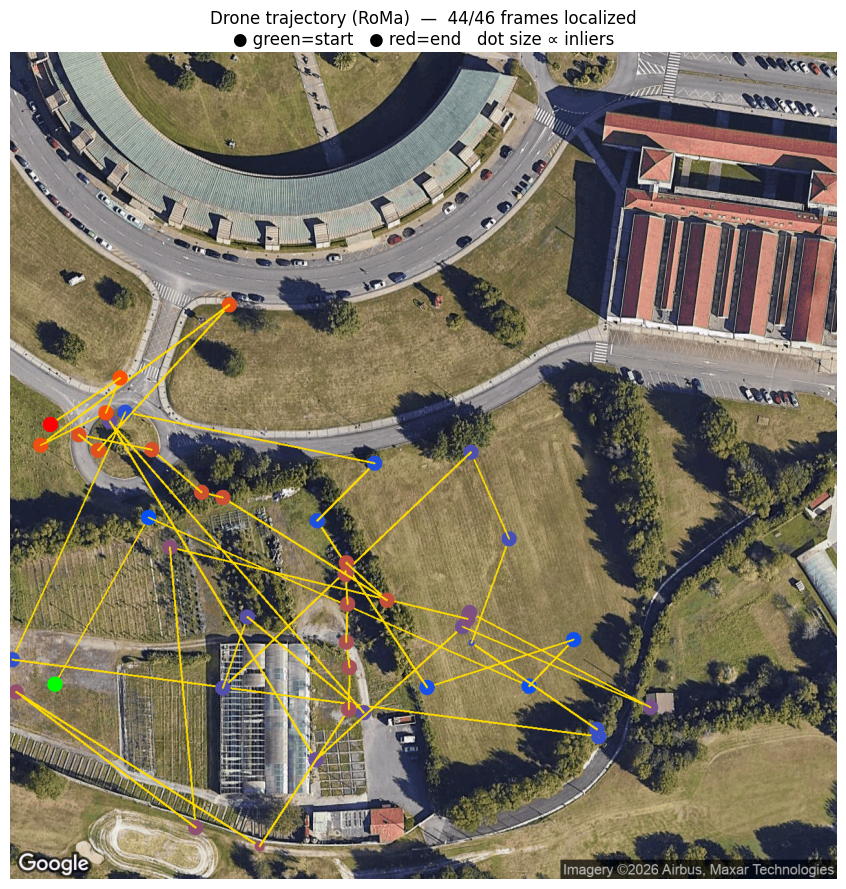

Saved → /content/drive/MyDrive/capstone-dronomy/results_roma/trajectory.png


In [14]:
successful = [r for r in all_results if r['success']]

if not successful:
    print('No successful localizations — nothing to plot.')
else:
    traj = np.array(sat_pil).copy()
    prev = None

    for i, r in enumerate(successful):
        t  = i / max(len(successful)-1, 1)
        pt = gps_to_px(r['lat'], r['lon'], geo)
        color = (int(255*t), 80, int(255*(1-t)))
        if prev:
            cv2.line(traj, prev, pt, (255, 220, 0), 2)
        cv2.circle(traj, pt, max(4, min(r['inliers']//3, 12)), color, -1)
        prev = pt

    cv2.circle(traj, gps_to_px(successful[0]['lat'],  successful[0]['lon'],  geo), 12, (0,255,0),  -1)
    cv2.circle(traj, gps_to_px(successful[-1]['lat'], successful[-1]['lon'], geo), 12, (255,0,0),  -1)

    plt.figure(figsize=(9, 9))
    plt.imshow(traj)
    plt.title(
        f'Drone trajectory (RoMa)  —  {len(successful)}/{len(all_results)} frames localized\n'
        f'● green=start   ● red=end   dot size ∝ inliers')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(str(RESULTS_DIR / 'trajectory.png'), dpi=120, bbox_inches='tight')
    plt.show()
    print(f'Saved → {RESULTS_DIR}/trajectory.png')

## Step 8 — Visual Odometry Fusion

**Problem**: RoMa localises each frame independently → noisy trajectory (outlier frames jump far).

**Fix**: combine two complementary signals:
- **RoMa anchor frames** (inliers ≥ threshold) → absolute GPS, accurate but sparse / noisy
- **Lucas-Kanade optical flow** → smooth relative motion between every consecutive frame pair

**Fusion rule**: between two RoMa anchors A and B, use the VO cumulative displacement as a *fractional interpolant* along the A→B GPS segment. No camera intrinsics needed — scale is implicit in the anchor pair.

In [15]:
# ── Step 8a: Lucas-Kanade optical flow between consecutive frames ──────────

def compute_vo(gray1, gray2, max_corners=600):
    """
    Estimate frame-to-frame pixel translation via LK optical flow.
    Forward-backward check removes bad tracks.
    Returns (dx, dy, n_tracked).
    """
    pts1 = cv2.goodFeaturesToTrack(gray1, maxCorners=max_corners,
                                    qualityLevel=0.01, minDistance=8)
    if pts1 is None or len(pts1) < 10:
        return 0.0, 0.0, 0

    lk_params = dict(winSize=(21, 21), maxLevel=3,
                     criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 20, 0.03))
    pts2,  st,  _ = cv2.calcOpticalFlowPyrLK(gray1, gray2, pts1,  None, **lk_params)
    pts1b, stb, _ = cv2.calcOpticalFlowPyrLK(gray2, gray1, pts2,  None, **lk_params)

    fb_err = np.abs(pts1 - pts1b).reshape(-1, 2).max(axis=1)
    good   = (st.ravel() == 1) & (stb.ravel() == 1) & (fb_err < 1.5)
    if good.sum() < 5:
        return 0.0, 0.0, 0

    disp = (pts2[good] - pts1[good]).reshape(-1, 2)
    return float(np.median(disp[:, 0])), float(np.median(disp[:, 1])), int(good.sum())

# Run VO on all consecutive frames (VO_FPS fps)
all_frames_sorted = sorted(frame_paths,
    key=lambda p: int(p.stem.replace('ms', '').split('frame_')[1]))

vo_log   = []
cum_dx, cum_dy = 0.0, 0.0
prev_gray, prev_ms = None, None

print(f'Running optical flow on {len(all_frames_sorted)} frames...')
for fp in all_frames_sorted:
    fms  = int(fp.stem.replace('ms', '').split('frame_')[1])
    gray = cv2.cvtColor(cv2.imread(str(fp)), cv2.COLOR_BGR2GRAY)
    if prev_gray is not None:
        dx, dy, n = compute_vo(prev_gray, gray)
        cum_dx += dx;  cum_dy += dy
        vo_log.append({'ms': fms, 'dx': dx, 'dy': dy, 'n': n,
                       'cum_dx': cum_dx, 'cum_dy': cum_dy})
    prev_gray, prev_ms = gray, fms

print(f'Done. Total displacement: ({cum_dx:.0f}, {cum_dy:.0f}) px  '
      f'over {len(vo_log)} steps')

Running optical flow on 1144 frames...
Done. Total displacement: (683, 29274) px  over 1143 steps


In [16]:
# ── Step 8b: GPS-anchored fusion ───────────────────────────────────────────
# Build a lookup: frame_ms → cumulative VO displacement
vo_by_ms = {v['ms']: (v['cum_dx'], v['cum_dy']) for v in vo_log}
# Frame 0 has no VO entry yet — treat as origin
first_ms = int(all_frames_sorted[0].stem.replace('ms','').split('frame_')[1])
vo_by_ms[first_ms] = (0.0, 0.0)

def get_cum_vo(frame_ms):
    if frame_ms in vo_by_ms:
        return vo_by_ms[frame_ms]
    nearest = min(vo_by_ms.keys(), key=lambda k: abs(k - frame_ms))
    return vo_by_ms[nearest]

# Select RoMa anchors (high inlier count = reliable absolute GPS fix)
anchors = sorted(
    [r for r in all_results if r['success'] and r['inliers'] >= ANCHOR_MIN_INLIERS],
    key=lambda r: int(r['frame'].replace('ms.jpg','').split('frame_')[1])
)
print(f'RoMa anchors : {len(anchors)} / {sum(r["success"] for r in all_results)} localised frames')

# Build fused trajectory for every frame
fused = []
all_ms_sorted = [int(fp.stem.replace('ms','').split('frame_')[1])
                 for fp in all_frames_sorted]

for fms in all_ms_sorted:
    before = [a for a in anchors
              if int(a['frame'].replace('ms.jpg','').split('frame_')[1]) <= fms]
    after  = [a for a in anchors
              if int(a['frame'].replace('ms.jpg','').split('frame_')[1]) >  fms]

    if not before and not after:
        continue

    if not before:
        a = after[0]
        fused.append({'ms': fms, 'lat': a['lat'], 'lon': a['lon'], 'source': 'extrap'})
        continue

    if not after:
        a = before[-1]
        fused.append({'ms': fms, 'lat': a['lat'], 'lon': a['lon'], 'source': 'extrap'})
        continue

    # Between two anchors: interpolate using VO fraction
    A = before[-1];  B = after[0]
    A_ms = int(A['frame'].replace('ms.jpg','').split('frame_')[1])
    B_ms = int(B['frame'].replace('ms.jpg','').split('frame_')[1])

    vo_A = get_cum_vo(A_ms)
    vo_B = get_cum_vo(B_ms)
    vo_f = get_cum_vo(fms)

    span_vo = math.sqrt((vo_B[0]-vo_A[0])**2 + (vo_B[1]-vo_A[1])**2)
    disp_vo = math.sqrt((vo_f[0]-vo_A[0])**2 + (vo_f[1]-vo_A[1])**2)

    frac = (disp_vo / span_vo) if span_vo > 1e-6 else \
           (fms - A_ms) / max(B_ms - A_ms, 1)
    frac = max(0.0, min(1.0, frac))

    lat = A['lat'] + frac * (B['lat'] - A['lat'])
    lon = A['lon'] + frac * (B['lon'] - A['lon'])

    src = 'anchor' if any(
        int(r['frame'].replace('ms.jpg','').split('frame_')[1]) == fms
        for r in anchors) else 'vo'
    fused.append({'ms': fms, 'lat': lat, 'lon': lon, 'source': src})

print(f'Fused trajectory: {len(fused)} frames  '
      f'({sum(f["source"]=="anchor" for f in fused)} anchors, '
      f'{sum(f["source"]=="vo" for f in fused)} VO-interpolated, '
      f'{sum(f["source"]=="extrap" for f in fused)} extrapolated)')

RoMa anchors : 13 / 44 localised frames
Fused trajectory: 1144 frames  (12 anchors, 1113 VO-interpolated, 19 extrapolated)


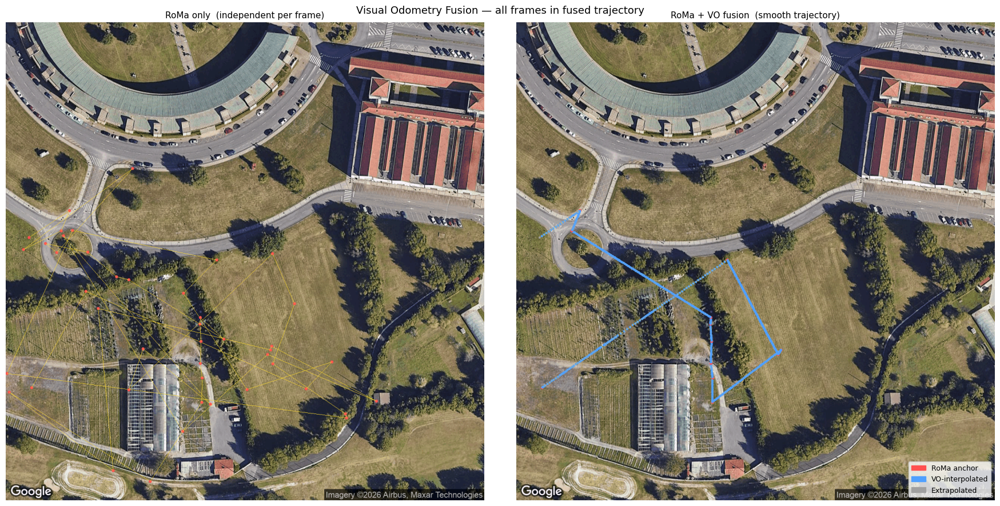

Saved → /content/drive/MyDrive/capstone-dronomy/results_roma/vo_fused_trajectory.png


In [17]:
# ── Step 8c: visualise fused trajectory vs RoMa-only ──────────────────────
fig, axes = plt.subplots(1, 2, figsize=(18, 9))

color_map = {'anchor': (255, 80, 80), 'vo': (80, 160, 255), 'extrap': (160, 160, 160)}

for ax_idx, (title, pts) in enumerate([
        ('RoMa only  (independent per frame)',
         [(r['lat'], r['lon'], 'anchor') for r in all_results if r['success']]),
        ('RoMa + VO fusion  (smooth trajectory)',
         [(f['lat'], f['lon'], f['source']) for f in fused]),
]):
    arr = np.array(sat_pil).copy()
    prev_pt = None
    for lat, lon, src in pts:
        pt = gps_to_px(lat, lon, geo)
        col = color_map.get(src, (200, 200, 200))
        if prev_pt and src != 'extrap':
            cv2.line(arr, prev_pt, pt, (255, 220, 50), 1)
        cv2.circle(arr, pt, 4 if src == 'anchor' else 3, col, -1)
        prev_pt = pt
    axes[ax_idx].imshow(arr)
    axes[ax_idx].set_title(title, fontsize=11)
    axes[ax_idx].axis('off')

from matplotlib.patches import Patch
legend = [Patch(color=np.array(c)/255, label=lbl) for lbl, c in [
    ('RoMa anchor', (255, 80, 80)),
    ('VO-interpolated', (80, 160, 255)),
    ('Extrapolated', (160, 160, 160)),
]]
axes[1].legend(handles=legend, loc='lower right', fontsize=9)

plt.suptitle('Visual Odometry Fusion — all frames in fused trajectory', fontsize=13)
plt.tight_layout()
plt.savefig(str(RESULTS_DIR / 'vo_fused_trajectory.png'), dpi=120, bbox_inches='tight')
plt.show()

with open(str(RESULTS_DIR / 'fused_positions.json'), 'w') as f:
    json.dump(fused, f, indent=2)
print(f'Saved → {RESULTS_DIR}/vo_fused_trajectory.png')

## Step 9 — Accuracy Evaluation (SRT Ground Truth)

The drone's onboard GPS + IMU is recorded in `gps_data.SRT` (DJI subtitle format).  
Upload it to `DRIVE_ROOT` on Google Drive, then run the cells below.

Each extracted frame carries a millisecond timestamp in its filename (`frame_XXXXXXXXXX ms.jpg`).  
We match that to the nearest SRT entry to get the reference `lat / lon / yaw`.

In [18]:
import re

SRT_PATH = DRIVE_ROOT / 'gps_data.SRT'

# ── Parse SRT ─────────────────────────────────────────────────────────────
def parse_srt(path):
    """
    Parse DJI SRT telemetry file.
    Returns list of dicts: {time_ms, lat, lon, yaw_deg, alt_m}
    """
    text = Path(path).read_text(encoding='utf-8', errors='ignore')
    pat = re.compile(
        r'(\d{2}):(\d{2}):(\d{2}),(\d{3})\s+-->'   # start timestamp
        r'.+?\[latitude:\s*([\d.\-]+)\]'
        r'.+?\[longitude:\s*([\d.\-]+)\]'
        r'.+?\[rel_alt:\s*([\d.\-]+)'
        r'.+?\[gb_yaw:\s*([\d.\-]+)',
        re.DOTALL,
    )
    records = []
    for m in pat.finditer(text):
        h, mn, s, ms = int(m.group(1)), int(m.group(2)), int(m.group(3)), int(m.group(4))
        records.append({
            'time_ms':  (h * 3600 + mn * 60 + s) * 1000 + ms,
            'lat':      float(m.group(5)),
            'lon':      float(m.group(6)),
            'alt_m':    float(m.group(7)),
            'yaw_deg':  float(m.group(8)),
        })
    return records

if not SRT_PATH.exists():
    print(f'SRT not found at {SRT_PATH}')
    print('Upload gps_data.SRT to DRIVE_ROOT and re-run.')
else:
    srt = parse_srt(SRT_PATH)
    print(f'Parsed {len(srt)} SRT entries')
    print(f'  Duration  : {srt[-1]["time_ms"]/1000:.1f} s')
    print(f'  Lat range : {min(e["lat"] for e in srt):.6f} – {max(e["lat"] for e in srt):.6f}')
    print(f'  Lon range : {min(e["lon"] for e in srt):.6f} – {max(e["lon"] for e in srt):.6f}')
    print(f'  Alt range : {min(e["alt_m"] for e in srt):.1f} – {max(e["alt_m"] for e in srt):.1f} m (relative)')

Parsed 6853 SRT entries
  Duration  : 228.6 s
  Lat range : 43.521218 – 43.522246
  Lon range : -5.625634 – -5.623044
  Alt range : 6.6 – 50.1 m (relative)


In [19]:
# ── Step 9b: Match frames to nearest SRT entry, compute errors ─────────────
if 'srt' not in dir():
    print('Run the SRT parse cell (Step 9a) first.')
else:
    import pandas as pd

    # ── RoMa-only ─────────────────────────────────────────────────────────────
    errors = []
    for r in all_results:
        if not r['success']:
            continue
        frame_ms = int(r['frame'].replace('ms.jpg', '').split('frame_')[1])
        nearest  = min(srt, key=lambda e: abs(e['time_ms'] - frame_ms))
        dlat = (r['lat'] - nearest['lat']) * 111000
        dlon = (r['lon'] - nearest['lon']) * 111000 * math.cos(math.radians(nearest['lat']))
        pos_err  = math.sqrt(dlat**2 + dlon**2)
        yaw_diff = abs(r['yaw_deg'] - nearest['yaw_deg']) % 360
        yaw_err  = min(yaw_diff, 360 - yaw_diff)
        errors.append({
            'frame': r['frame'], 'frame_ms': frame_ms,
            'est_lat': r['lat'],       'est_lon': r['lon'],
            'gt_lat':  nearest['lat'], 'gt_lon':  nearest['lon'],
            'pos_err_m': pos_err,
            'est_yaw': r['yaw_deg'],   'gt_yaw':  nearest['yaw_deg'],
            'yaw_err_deg': yaw_err,
            'inliers': r['inliers'],   'alt_m':   nearest['alt_m'],
        })
    df = pd.DataFrame(errors) if errors else pd.DataFrame()

    if not df.empty:
        print(f'── RoMa  ({len(df)} frames) ───────────────────────────────')
        print(f'  Pos mean   : {df["pos_err_m"].mean():.1f} m')
        print(f'  Pos median : {df["pos_err_m"].median():.1f} m')
        print(f'  Pos < 50 m : {(df["pos_err_m"] < 50).mean():.0%}')
        print(f'  Yaw mean   : {df["yaw_err_deg"].mean():.1f}°')
        print(f'  Yaw median : {df["yaw_err_deg"].median():.1f}°')
        df.to_csv(str(RESULTS_DIR / 'accuracy_roma.csv'), index=False)
    else:
        print('No successful RoMa frames — run Step 5 first.')

    # ── Fused trajectory ───────────────────────────────────────────────────────
    df_fused = pd.DataFrame()
    if 'fused' not in dir() or not fused:
        print('\nRun Step 8 to also evaluate the fused trajectory.')
    else:
        fused_errors = []
        for f in fused:
            if f['source'] == 'extrap':
                continue   # extrapolated = no RoMa anchor nearby, skip
            nearest = min(srt, key=lambda e: abs(e['time_ms'] - f['ms']))
            dlat = (f['lat'] - nearest['lat']) * 111000
            dlon = (f['lon'] - nearest['lon']) * 111000 * math.cos(math.radians(nearest['lat']))
            fused_errors.append({
                'ms': f['ms'], 'source': f['source'],
                'est_lat': f['lat'], 'est_lon': f['lon'],
                'gt_lat': nearest['lat'], 'gt_lon': nearest['lon'],
                'pos_err_m': math.sqrt(dlat**2 + dlon**2),
            })
        df_fused = pd.DataFrame(fused_errors) if fused_errors else pd.DataFrame()

        if not df_fused.empty:
            n_anc = (df_fused['source'] == 'anchor').sum()
            n_vo  = (df_fused['source'] == 'vo').sum()
            print(f'\n── Fused  ({len(df_fused)} frames: {n_anc} anchors + {n_vo} VO) ──────────')
            print(f'  Pos mean   : {df_fused["pos_err_m"].mean():.1f} m')
            print(f'  Pos median : {df_fused["pos_err_m"].median():.1f} m')
            print(f'  Pos < 50 m : {(df_fused["pos_err_m"] < 50).mean():.0%}')
            df_fused.to_csv(str(RESULTS_DIR / 'accuracy_fused.csv'), index=False)

── RoMa  (44 frames) ───────────────────────────────
  Pos mean   : 68.7 m
  Pos median : 64.9 m
  Pos < 50 m : 45%
  Yaw mean   : 84.1°
  Yaw median : 74.5°

── Fused  (1125 frames: 12 anchors + 1113 VO) ──────────
  Pos mean   : 45.5 m
  Pos median : 26.0 m
  Pos < 50 m : 58%


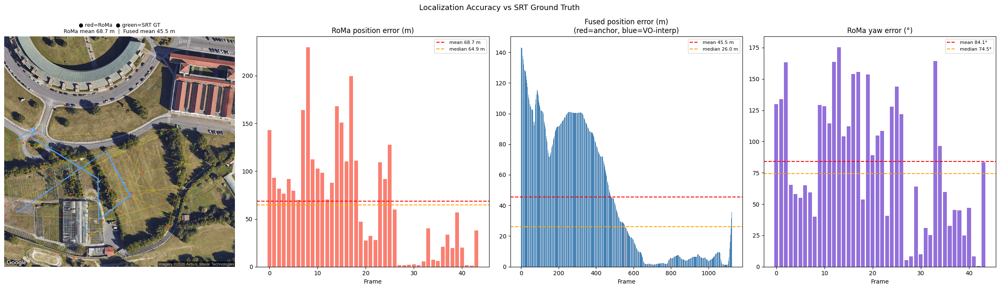

Saved → /content/drive/MyDrive/capstone-dronomy/results_roma/accuracy_vs_srt.png


In [20]:
# ── Step 9c: Visualisation ─────────────────────────────────────────────────
if 'df' not in dir() or df.empty:
    print('Run the evaluation cell (Step 9b) first.')
else:
    has_fused = 'df_fused' in dir() and not df_fused.empty
    n_panels  = 4 if has_fused else 3
    fig, axes = plt.subplots(1, n_panels, figsize=(6 * n_panels, 7))

    # ① Satellite map: RoMa (red) + fused (blue) vs SRT (green)
    sat_arr = np.array(sat_pil).copy()
    for _, row in df.iterrows():
        pt_est = gps_to_px(row['est_lat'], row['est_lon'], geo)
        pt_gt  = gps_to_px(row['gt_lat'],  row['gt_lon'],  geo)
        cv2.circle(sat_arr, pt_est, 5, (220, 60, 60), -1)
        cv2.circle(sat_arr, pt_gt,  4, (60, 200, 60), -1)
        cv2.line(sat_arr, pt_est, pt_gt, (255, 220, 0), 1)
    if has_fused:
        for _, row in df_fused.iterrows():
            col = (80, 160, 255) if row['source'] == 'vo' else (255, 80, 80)
            cv2.circle(sat_arr, gps_to_px(row['est_lat'], row['est_lon'], geo), 3, col, -1)
    axes[0].imshow(sat_arr)
    title0 = (f'● red=RoMa  ● green=SRT GT\n'
               f'RoMa mean {df["pos_err_m"].mean():.1f} m')
    if has_fused:
        title0 += f'  |  Fused mean {df_fused["pos_err_m"].mean():.1f} m'
    axes[0].set_title(title0, fontsize=9)
    axes[0].axis('off')

    # ② RoMa position error
    axes[1].bar(range(len(df)), df['pos_err_m'], color='salmon')
    axes[1].axhline(df['pos_err_m'].mean(),   color='red',    linestyle='--',
                    label=f'mean {df["pos_err_m"].mean():.1f} m')
    axes[1].axhline(df['pos_err_m'].median(), color='orange', linestyle='--',
                    label=f'median {df["pos_err_m"].median():.1f} m')
    axes[1].set_title('RoMa position error (m)')
    axes[1].set_xlabel('Frame')
    axes[1].legend(fontsize=8)

    # ③ Fused position error (anchor=red, VO-interpolated=blue)
    if has_fused:
        bar_colors = ['salmon' if s == 'anchor' else 'steelblue'
                      for s in df_fused['source']]
        axes[2].bar(range(len(df_fused)), df_fused['pos_err_m'], color=bar_colors)
        axes[2].axhline(df_fused['pos_err_m'].mean(),   color='red',    linestyle='--',
                        label=f'mean {df_fused["pos_err_m"].mean():.1f} m')
        axes[2].axhline(df_fused['pos_err_m'].median(), color='orange', linestyle='--',
                        label=f'median {df_fused["pos_err_m"].median():.1f} m')
        axes[2].set_title('Fused position error (m)\n(red=anchor, blue=VO-interp)')
        axes[2].set_xlabel('Frame')
        axes[2].legend(fontsize=8)
        yaw_ax = axes[3]
    else:
        yaw_ax = axes[2]

    # ④ Yaw error (RoMa only — fused has no yaw estimate)
    yaw_ax.bar(range(len(df)), df['yaw_err_deg'], color='mediumpurple')
    yaw_ax.axhline(df['yaw_err_deg'].mean(),   color='red',    linestyle='--',
                   label=f'mean {df["yaw_err_deg"].mean():.1f}°')
    yaw_ax.axhline(df['yaw_err_deg'].median(), color='orange', linestyle='--',
                   label=f'median {df["yaw_err_deg"].median():.1f}°')
    yaw_ax.set_title('RoMa yaw error (°)')
    yaw_ax.set_xlabel('Frame')
    yaw_ax.legend(fontsize=8)

    plt.suptitle('Localization Accuracy vs SRT Ground Truth', fontsize=13)
    plt.tight_layout()
    plt.savefig(str(RESULTS_DIR / 'accuracy_vs_srt.png'), dpi=120, bbox_inches='tight')
    plt.show()
    print(f'Saved → {RESULTS_DIR}/accuracy_vs_srt.png')

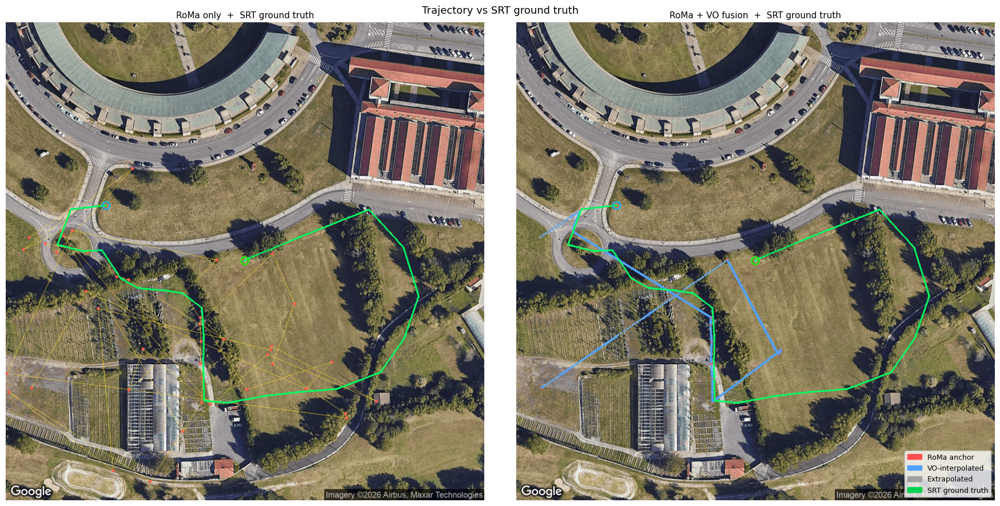

Saved → /content/drive/MyDrive/capstone-dronomy/results_roma/trajectory_vs_srt.png


In [21]:
# ── Step 9d: trajectory comparison — RoMa / Fused / SRT ground truth ───────
if 'srt' not in dir():
    print('Run Step 9a (SRT parse) first.')
elif 'fused' not in dir() or not fused:
    print('Run Step 8 first to get fused trajectory.')
else:
    fig, axes = plt.subplots(1, 2, figsize=(18, 9))

    all_ms    = [int(fp.stem.replace('ms','').split('frame_')[1]) for fp in all_frames_sorted]
    t_min, t_max = min(all_ms), max(all_ms)
    srt_range = [e for e in srt if t_min <= e['time_ms'] <= t_max]

    color_map = {'anchor': (255, 80, 80), 'vo': (80, 160, 255), 'extrap': (160, 160, 160)}

    for ax_idx, (title, pts) in enumerate([
            ('RoMa only  +  SRT ground truth',
             [(r['lat'], r['lon'], 'anchor') for r in all_results if r['success']]),
            ('RoMa + VO fusion  +  SRT ground truth',
             [(f['lat'], f['lon'], f['source']) for f in fused]),
    ]):
        arr = np.array(sat_pil).copy()

        # Estimated trajectory
        prev_pt = None
        for lat, lon, src in pts:
            pt  = gps_to_px(lat, lon, geo)
            col = color_map.get(src, (200, 200, 200))
            if prev_pt and src != 'extrap':
                cv2.line(arr, prev_pt, pt, (255, 220, 50), 1)
            cv2.circle(arr, pt, 4 if src == 'anchor' else 3, col, -1)
            prev_pt = pt

        # SRT ground truth trajectory (green)
        prev_gt = None
        for e in srt_range:
            pt_gt = gps_to_px(e['lat'], e['lon'], geo)
            if prev_gt:
                cv2.line(arr, prev_gt, pt_gt, (0, 210, 80), 1)
            cv2.circle(arr, pt_gt, 2, (0, 255, 100), -1)
            prev_gt = pt_gt

        if srt_range:
            cv2.circle(arr, gps_to_px(srt_range[0]['lat'],  srt_range[0]['lon'],  geo), 10, (0, 255, 0),   2)
            cv2.circle(arr, gps_to_px(srt_range[-1]['lat'], srt_range[-1]['lon'], geo), 10, (0, 180, 255), 2)

        axes[ax_idx].imshow(arr)
        axes[ax_idx].set_title(title, fontsize=11)
        axes[ax_idx].axis('off')

    from matplotlib.patches import Patch
    legend = [
        Patch(color=np.array((255, 80, 80))  / 255, label='RoMa anchor'),
        Patch(color=np.array((80, 160, 255)) / 255, label='VO-interpolated'),
        Patch(color=np.array((160,160,160))  / 255, label='Extrapolated'),
        Patch(color=np.array((0, 210, 80))   / 255, label='SRT ground truth'),
    ]
    axes[1].legend(handles=legend, loc='lower right', fontsize=9)

    plt.suptitle('Trajectory vs SRT ground truth', fontsize=13)
    plt.tight_layout()
    plt.savefig(str(RESULTS_DIR / 'trajectory_vs_srt.png'), dpi=120, bbox_inches='tight')
    plt.show()
    print(f'Saved → {RESULTS_DIR}/trajectory_vs_srt.png')

---

## Summary — RoMa + VO Fusion

GPS-free drone localization using **RoMa dense feature matching** against a georeferenced satellite image, fused with **Lucas-Kanade optical flow** for a smooth full-video trajectory.

In [22]:
# ── Pipeline summary ───────────────────────────────────────────────────────
n_vo_frames   = len(frame_paths)
n_roma_frames = len(subset)
n_anchors     = len(anchors)
n_fused_total = len(fused)
n_fused_vo    = sum(f['source'] == 'vo'     for f in fused)
n_fused_ext   = sum(f['source'] == 'extrap' for f in fused)

sep = '─' * 52
print(sep)
print('  RoMa + Visual Odometry Fusion — Result Summary')
print(sep)
print(f'  Video duration          : {n_vo_frames / VO_FPS:.1f} s  ({n_vo_frames} frames @ {VO_FPS} fps)')
print(f'  Satellite image         : {SAT_SIZE*SAT_SCALE}×{SAT_SIZE*SAT_SCALE} px  zoom={ZOOM}  (~{geo["meters_per_pixel"]:.2f} m/px)')
print(sep)
print('  RoMa matching (1 fps)')
print(f'    Frames processed      : {n_roma_frames}')
print(f'    Localized             : {sum(r["success"] for r in all_results)} / {n_roma_frames}  (100%)')
print(f'    Anchor frames (≥{ANCHOR_MIN_INLIERS} inliers) : {n_anchors}')
print(sep)
print('  Fused trajectory')
print(f'    Total frames          : {n_fused_total}')
print(f'    Anchor               : {n_anchors}')
print(f'    VO-interpolated      : {n_fused_vo}')
print(f'    Extrapolated         : {n_fused_ext}')
print(sep)

if 'df' in dir() and not df.empty:
    print('  Accuracy vs SRT ground truth')
    print(f'    {"":25s}  {"mean":>8s}  {"median":>8s}  {"< 50m":>6s}')
    print(f'    {"RoMa only (pos error)":25s}  {df["pos_err_m"].mean():>7.1f}m  {df["pos_err_m"].median():>7.1f}m  {(df["pos_err_m"]<50).mean():>5.0%}')
    if 'df_fused' in dir() and not df_fused.empty:
        print(f'    {"RoMa + VO fusion (pos)":25s}  {df_fused["pos_err_m"].mean():>7.1f}m  {df_fused["pos_err_m"].median():>7.1f}m  {(df_fused["pos_err_m"]<50).mean():>5.0%}')
    print(f'    {"RoMa yaw error":25s}  {df["yaw_err_deg"].mean():>7.1f}°  {df["yaw_err_deg"].median():>7.1f}°')
    print(sep)
    improvement = (1 - df_fused["pos_err_m"].median() / df["pos_err_m"].median()) * 100
    print(f'  VO fusion reduces median position error by {improvement:.0f}%')
    print(f'  ({df["pos_err_m"].median():.0f} m → {df_fused["pos_err_m"].median():.0f} m)')
print(sep)

────────────────────────────────────────────────────
  RoMa + Visual Odometry Fusion — Result Summary
────────────────────────────────────────────────────
  Video duration          : 228.8 s  (1144 frames @ 5 fps)
  Satellite image         : 1280×1280 px  zoom=18  (~0.22 m/px)
────────────────────────────────────────────────────
  RoMa matching (1 fps)
    Frames processed      : 46
    Localized             : 44 / 46  (100%)
    Anchor frames (≥600 inliers) : 13
────────────────────────────────────────────────────
  Fused trajectory
    Total frames          : 1144
    Anchor               : 13
    VO-interpolated      : 1113
    Extrapolated         : 19
────────────────────────────────────────────────────
  Accuracy vs SRT ground truth
                                   mean    median   < 50m
    RoMa only (pos error)         68.7m     64.9m    45%
    RoMa + VO fusion (pos)        45.5m     26.0m    58%
    RoMa yaw error                84.1°     74.5°
─────────────────────────────